In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Basic libraries
import pandas as pd
import numpy as np
import re
from pprint import pprint

# Visualization
import seaborn as sns


# Scikit-learn: text vectorization, model training, evaluation
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Model saving/loading
import joblib

# Optional: PyTorch if using deep learning models
import torch

In [ ]:
file_path = "/content/drive/MyDrive/Tushitaacleaned_disaster_tweets.csv"
try:
    df = pd.read_csv(file_path)
    print("File loaded successfully.")
except Exception as e:
    print(f"An error occurred: {e}")

File loaded successfully.


In [ ]:
df.head()

,tweet_id,tweet_text,label,source,clean_text
0,'383600460340666369',RT @Faiz_Baluch: #BalochistanEarthQuake Pakist...,other_useful_information,2013_Pakistan_Earthquake,balochistanearthquake pakistan army terrorizin...
1,'383790723222364161',#Earthquake 2013-09-28 02:39:43 (M5.0) EAST OF...,other_useful_information,2013_Pakistan_Earthquake,earthquake east south sandwich island fa notice
2,'384232048124518400',#earthquake M2.2: Puerto Rico region http://t....,other_useful_information,2013_Pakistan_Earthquake,earthquake puerto rico region
3,'384860484643475456',#PAKISTAN: #NASA releases images of Pakistan's...,other_useful_information,2013_Pakistan_Earthquake,pakistan nasa release image pakistan earthquak...
4,'383407962619772928',"【#USGS #alert】 M 1.5, Central Alaska: Septembe...",other_useful_information,2013_Pakistan_Earthquake,usgs alert central alaska september gmt earthq...


In [ ]:
df.shape

(22099, 5)

In [ ]:
df = df.dropna(subset=['clean_text'])  # Drop rows where clean_text is NaN


In [ ]:
# Step 1: NLTK Setup
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
file_path = '/content/drive/MyDrive/TwitterData - Sheet1.csv'
try:
    df_RealData = pd.read_csv(file_path)
    print("File loaded successfully.")
except Exception as e:
    print(f"An error occurred: {e}")

File loaded successfully.


In [ ]:
df_RealData.head()

,Tweet ID,URL,Content,Likes,Retweet,Reply,Date,Views count,Quote count,Location,Source,#Hashtag
0,1.933136e+18,https://x.com/SouthernDefence/status/193313554...,Pakistan expresses deep sorrow over the tragic...,129,60,27,"June 12, 2025 at 12:13 PM",55702,NaN,NaN,NaN,NaN
1,1.933064e+18,https://x.com/masijeevi/status/193306380788008...,Biggest Foreign Policy disaster for India is i...,3565,895,104,"June 12, 2025 at 07:28 AM",57279,NaN,NaN,NaN,NaN
2,1.933148e+18,https://x.com/viralikpa/status/193314784992109...,The footage from the Air India disaster is sim...,4,2,0,"June 12, 2025 at 01:02 PM",2410,NaN,NaN,NaN,NaN
3,1.933261e+18,https://x.com/DeepikaBhardwaj/status/193326147...,This disaster could have been avoided only if ...,2063,429,103,"June 12, 2025 at 08:33 PM",162829,NaN,NaN,NaN,NaN
4,1.933290e+18,https://x.com/pubity/status/1933290008833921483,"With over 260 lives lost, the Air India crash ...",523,34,6,"June 12, 2025 at 10:27 PM",25421,NaN,NaN,NaN,NaN


In [ ]:
import string
# ✅ Step 2: Define the clean_text function BEFORE using it
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"http\S+|www\S+", "", text)  # Remove URLs
    text = re.sub(r"@\w+", "", text)            # Remove mentions
    text = re.sub(r"#\w+", "", text)            # Remove hashtags
    text = re.sub(r"\d+", "", text)             # Remove numbers
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)  # Remove punctuation
    text = re.sub(r"\s+", " ", text).strip()    # Remove extra spaces
    return text

# Step 3: Clean the Content column
df_RealData['clean_text'] = df_RealData['Content'].fillna('').apply(clean_text)

In [ ]:
bow = CountVectorizer(max_features=5000)
X_bow = bow.fit_transform(df['clean_text'])

X_train, X_test, y_train, y_test = train_test_split(X_bow, df['label'], test_size=0.2, random_state=42)

model_bow = LogisticRegression(max_iter=1000)
model_bow.fit(X_train, y_train)
y_pred_bow = model_bow.predict(X_test)

print("Bag of Words Classification Report:")
print(classification_report(y_test, y_pred_bow))


Bag of Words Classification Report:
                                                   precision    recall  f1-score   support

                                  affected_people       0.65      0.63      0.64        95
                               caution_and_advice       0.53      0.45      0.49       193
                                   deaths_reports       0.56      0.33      0.42        15
                        disease_signs_or_symptoms       0.58      0.68      0.63        53
                             disease_transmission       0.75      0.48      0.59        50
                 displaced_people_and_evacuations       0.79      0.58      0.67       117
donation_needs_or_offers_or_volunteering_services       0.74      0.72      0.73       611
              infrastructure_and_utilities_damage       0.70      0.66      0.68       296
                           injured_or_dead_people       0.91      0.93      0.92       584
                  missing_trapped_or_found_people    

In [ ]:
# --- NEW: Add these lines immediately after training and fitting ---
# Save the trained model
joblib.dump(model_bow, 'model_bow.pkl')
print("Trained Logistic Regression model saved as 'model_bow.pkl'")

# Save the fitted CountVectorizer
joblib.dump(bow, 'bow_vectorizer.pkl')
print("Fitted CountVectorizer saved as 'bow_vectorizer.pkl'")


Trained Logistic Regression model saved as 'model_bow.pkl'
Fitted CountVectorizer saved as 'bow_vectorizer.pkl'


In [ ]:
try:
    model_bow = joblib.load('model_bow.pkl')
    bow = joblib.load('bow_vectorizer.pkl')
    print("Trained model and vectorizer loaded successfully.")
except FileNotFoundError:
    print("Error: 'model_bow.pkl' or 'bow_vectorizer.pkl' not found.")
    print("Please ensure you have saved your trained model and vectorizer from the previous step.")
    print("Example: joblib.dump(model_bow, 'model_bow.pkl') and joblib.dump(bow, 'bow_vectorizer.pkl')")
    exit()
def clean_text_function(text):
    if pd.isna(text): # Handle NaN values which might be in 'Content' column
        return ""
    text = str(text).lower()  # Convert to lowercase
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE) # Remove URLs
    text = re.sub(r'@\w+', '', text) # Remove mentions
    text = re.sub(r'#\w+', '', text) # Remove hashtags
    text = re.sub(r'\d+', '', text) # Remove numbers
    text = re.sub(r'[^\w\s]', '', text) # Remove punctuation
    text = text.strip() # Remove leading/trailing whitespace
    return text

# --- Step 4: Apply preprocessing to the 'Content' column of the real data ---
# This is crucial for consistency with how the model was trained.
df_RealData['cleaned_content'] = df_RealData['Content'].apply(clean_text_function)
print("Real data content cleaned.")

# --- Step 5: Transform the cleaned real data using the *fitted* CountVectorizer ---
# Use .transform(), NOT .fit_transform()
X_real_bow = bow.transform(df_RealData['cleaned_content'])
print("Real data transformed into Bag of Words representation.")

# --- Step 6: Make predictions on the real data ---
predicted_categories = model_bow.predict(X_real_bow)
df_RealData['predicted_category'] = predicted_categories
print("Predictions made on real data.")

# --- Step 7: Display results ---
print("\nReal Data with Predicted Categories:")
df_RealData[['Content', 'predicted_category']].head()

# Optional: Count the predictions
print("\n🔢 Prediction Counts:")
print(df_RealData['predicted_category'].value_counts())


Trained model and vectorizer loaded successfully.
Real data content cleaned.
Real data transformed into Bag of Words representation.
Predictions made on real data.

Real Data with Predicted Categories:

🔢 Prediction Counts:
predicted_category
not_related_or_irrelevant                            563
other_useful_information                             519
donation_needs_or_offers_or_volunteering_services    293
injured_or_dead_people                               163
infrastructure_and_utilities_damage                  129
sympathy_and_emotional_support                        71
missing_trapped_or_found_people                       62
caution_and_advice                                    47
displaced_people_and_evacuations                      29
treatment                                              2
Name: count, dtype: int64


In [ ]:
import pandas as pd
import numpy as np
import re
import string
import joblib
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report

# ✅ Clean text function (you already defined it correctly)
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"http\S+|www\S+", "", text)
    text = re.sub(r"@\w+", "", text)
    text = re.sub(r"#\w+", "", text)
    text = re.sub(r"\d+", "", text)
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text

# ✅ Preprocess text and encode labels
df['clean_text'] = df['clean_text'].fillna('').apply(clean_text)

# Label encoding
le = LabelEncoder()
df['encoded_label'] = le.fit_transform(df['label'])
label_names = le.classes_

# ✅ Bag of Words
bow = CountVectorizer(max_features=5000)
X_bow = bow.fit_transform(df['clean_text'])
y_bow = df['encoded_label']

X_train, X_test, y_train, y_test = train_test_split(X_bow, y_bow, test_size=0.2, stratify=y_bow, random_state=42)


In [ ]:
# ✅ Train Random Forest
rf_model = RandomForestClassifier(n_estimators=200, class_weight='balanced', random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

# ✅ Evaluate
y_pred_rf = rf_model.predict(X_test)
print("🌲 Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf, target_names=label_names))

# ✅ Predict on real data
df_RealData['cleaned_content'] = df_RealData['Content'].fillna('').apply(clean_text)
X_real_bow = bow.transform(df_RealData['cleaned_content'])
real_preds_rf = rf_model.predict(X_real_bow)
df_RealData['rf_predicted_category'] = le.inverse_transform(real_preds_rf)

print("\n🔢 RF Prediction Counts:")
print(df_RealData['rf_predicted_category'].value_counts())


🌲 Random Forest Classification Report:
                                                   precision    recall  f1-score   support

                                  affected_people       0.79      0.59      0.68       110
                               caution_and_advice       0.55      0.28      0.37       211
                                   deaths_reports       0.71      0.33      0.45        15
                        disease_signs_or_symptoms       0.63      0.75      0.69        69
                             disease_transmission       0.76      0.63      0.69        67
                 displaced_people_and_evacuations       0.79      0.46      0.58       114
donation_needs_or_offers_or_volunteering_services       0.67      0.77      0.71       600
              infrastructure_and_utilities_damage       0.68      0.53      0.60       286
                           injured_or_dead_people       0.88      0.91      0.89       548
                  missing_trapped_or_found_people 

In [ ]:
# ✅ Train XGBoost
xgb_model = XGBClassifier(
    objective='multi:softmax',
    num_class=len(label_names),
    eval_metric='mlogloss',
    use_label_encoder=False,
    n_estimators=200,
    learning_rate=0.1,
    max_depth=8,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)

xgb_model.fit(X_train, y_train)

# ✅ Evaluate
y_pred_xgb = xgb_model.predict(X_test)
print("⚡ XGBoost Classification Report:")
print(classification_report(y_test, y_pred_xgb, target_names=label_names))

# ✅ Predict on real data
real_preds_xgb = xgb_model.predict(X_real_bow)
df_RealData['xgb_predicted_category'] = le.inverse_transform(real_preds_xgb)

print("\n🔢 XGB Prediction Counts:")
print(df_RealData['xgb_predicted_category'].value_counts())


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [13:14:49] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


⚡ XGBoost Classification Report:
                                                   precision    recall  f1-score   support

                                  affected_people       0.75      0.61      0.67       110
                               caution_and_advice       0.59      0.33      0.42       211
                                   deaths_reports       0.54      0.47      0.50        15
                        disease_signs_or_symptoms       0.64      0.68      0.66        69
                             disease_transmission       0.79      0.73      0.76        67
                 displaced_people_and_evacuations       0.68      0.53      0.59       114
donation_needs_or_offers_or_volunteering_services       0.73      0.76      0.74       600
              infrastructure_and_utilities_damage       0.67      0.60      0.63       286
                           injured_or_dead_people       0.89      0.92      0.91       548
                  missing_trapped_or_found_people       

In [ ]:
joblib.dump(rf_model, 'model_rf_bow.pkl')
joblib.dump(xgb_model, 'model_xgb_bow.pkl')
joblib.dump(bow, 'bow_vectorizer.pkl')
joblib.dump(le, 'label_encoder.pkl')


['label_encoder.pkl']

In [ ]:
!pip install matplotlib seaborn scikit-learn


📊 Logistic Regression Classification Report:
                                                   precision    recall  f1-score   support

                                  affected_people       0.72      0.65      0.69       110
                               caution_and_advice       0.55      0.40      0.46       211
                                   deaths_reports       0.45      0.33      0.38        15
                        disease_signs_or_symptoms       0.67      0.72      0.69        69
                             disease_transmission       0.73      0.69      0.71        67
                 displaced_people_and_evacuations       0.75      0.49      0.59       114
donation_needs_or_offers_or_volunteering_services       0.70      0.75      0.72       600
              infrastructure_and_utilities_damage       0.64      0.60      0.62       286
                           injured_or_dead_people       0.89      0.91      0.90       548
                  missing_trapped_or_found_p

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [13:17:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


⚡ XGBoost Classification Report:
                                                   precision    recall  f1-score   support

                                  affected_people       0.75      0.61      0.67       110
                               caution_and_advice       0.59      0.33      0.42       211
                                   deaths_reports       0.54      0.47      0.50        15
                        disease_signs_or_symptoms       0.64      0.68      0.66        69
                             disease_transmission       0.79      0.73      0.76        67
                 displaced_people_and_evacuations       0.68      0.53      0.59       114
donation_needs_or_offers_or_volunteering_services       0.73      0.76      0.74       600
              infrastructure_and_utilities_damage       0.67      0.60      0.63       286
                           injured_or_dead_people       0.89      0.92      0.91       548
                  missing_trapped_or_found_people       

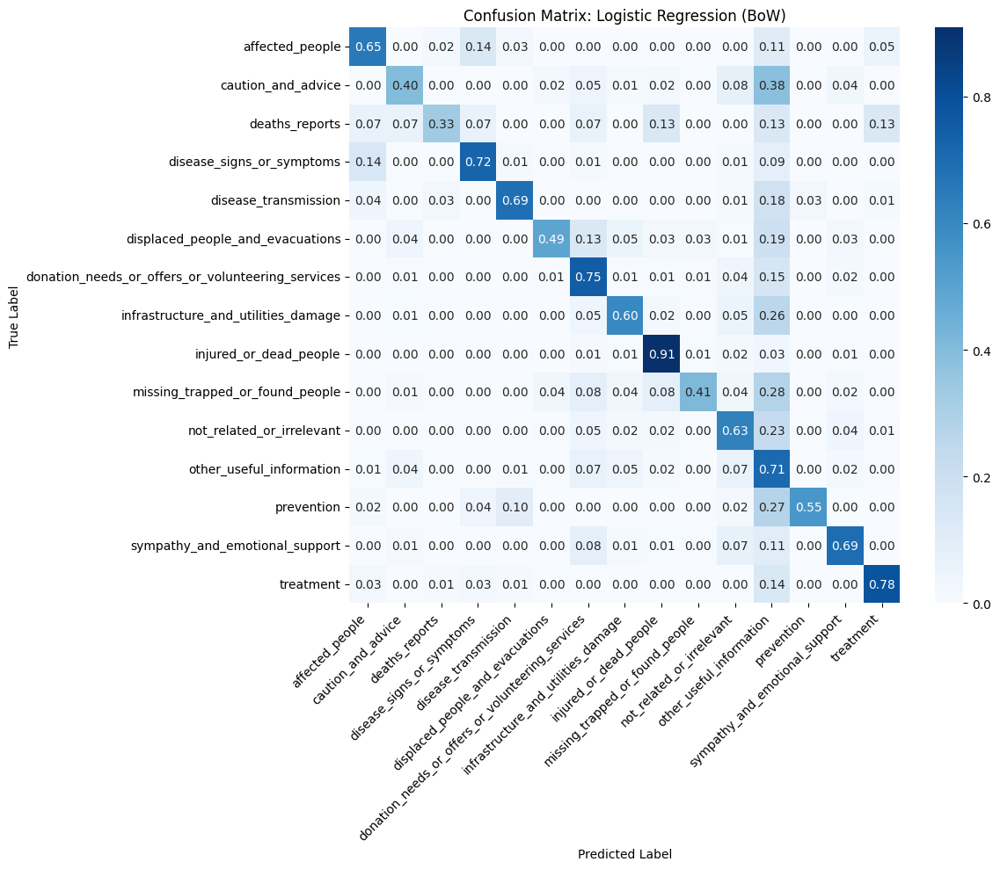

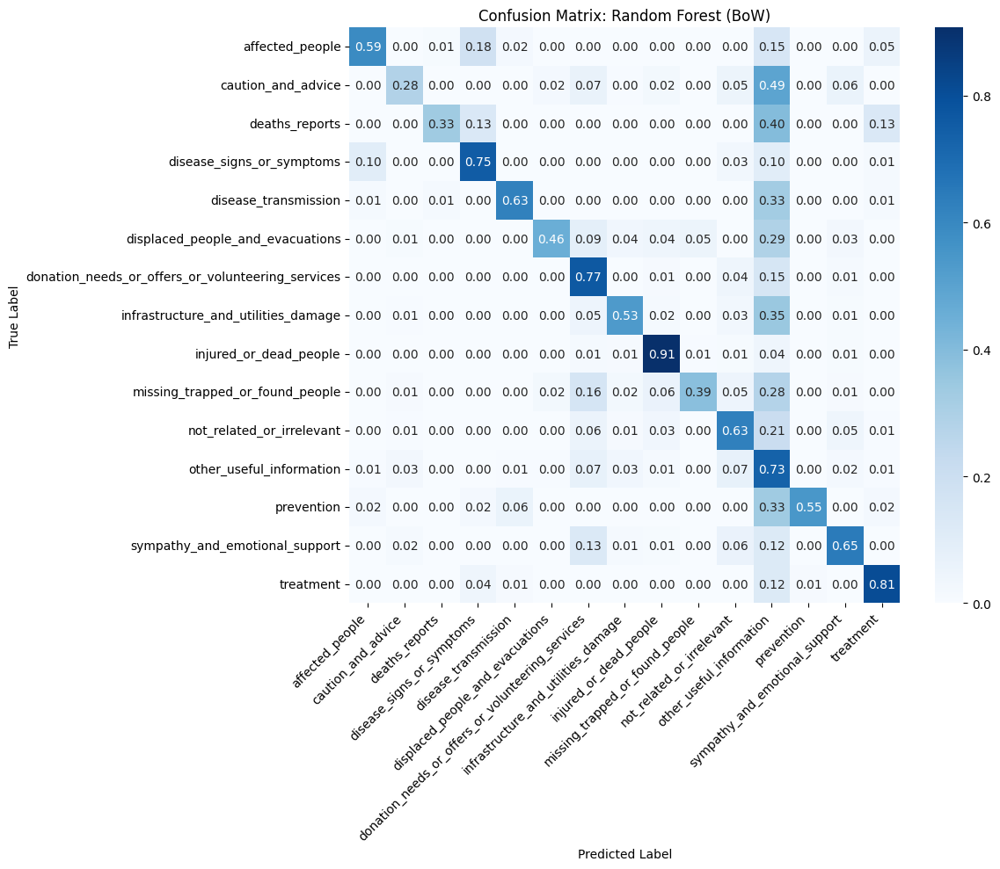

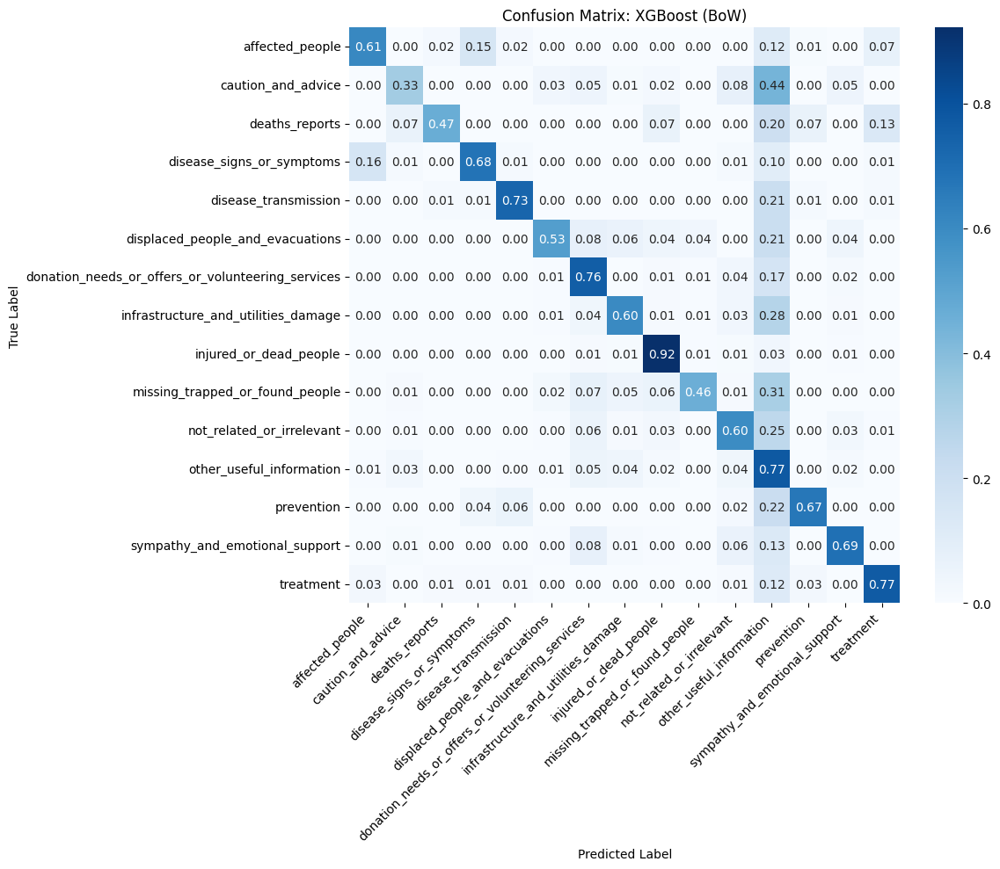

In [ ]:
import pandas as pd
import numpy as np
import re
import string
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix

# === Clean text ===
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"http\S+|www\S+", "", text)
    text = re.sub(r"@\w+", "", text)
    text = re.sub(r"#\w+", "", text)
    text = re.sub(r"\d+", "", text)
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text

df['clean_text'] = df['clean_text'].fillna('').apply(clean_text)

# === Encode labels ===
le = LabelEncoder()
df['encoded_label'] = le.fit_transform(df['label'])
label_names = le.classes_

# === BoW ===
bow = CountVectorizer(max_features=5000)
X_bow = bow.fit_transform(df['clean_text'])
y_bow = df['encoded_label']

X_train, X_test, y_train, y_test = train_test_split(X_bow, y_bow, test_size=0.2, stratify=y_bow, random_state=42)

# === Logistic Regression ===
model_bow = LogisticRegression(max_iter=1000)
model_bow.fit(X_train, y_train)
y_pred_bow = model_bow.predict(X_test)

print("📊 Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_bow, target_names=label_names))

# === Random Forest ===
rf_model = RandomForestClassifier(n_estimators=200, class_weight='balanced', random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

print("🌲 Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf, target_names=label_names))

# === XGBoost ===
xgb_model = XGBClassifier(
    objective='multi:softmax',
    num_class=len(label_names),
    eval_metric='mlogloss',
    use_label_encoder=False,
    max_depth=8,
    learning_rate=0.1,
    n_estimators=200,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)

print("⚡ XGBoost Classification Report:")
print(classification_report(y_test, y_pred_xgb, target_names=label_names))

# === Confusion Matrix Plot Function ===
def plot_confusion_matrix(y_true, y_pred, labels, title):
    cm = confusion_matrix(y_true, y_pred, normalize='true')
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
    plt.title(f'Confusion Matrix: {title}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# === Plot Confusion Matrices ===
plot_confusion_matrix(y_test, y_pred_bow, label_names, "Logistic Regression (BoW)")
plot_confusion_matrix(y_test, y_pred_rf, label_names, "Random Forest (BoW)")
plot_confusion_matrix(y_test, y_pred_xgb, label_names, "XGBoost (BoW)")


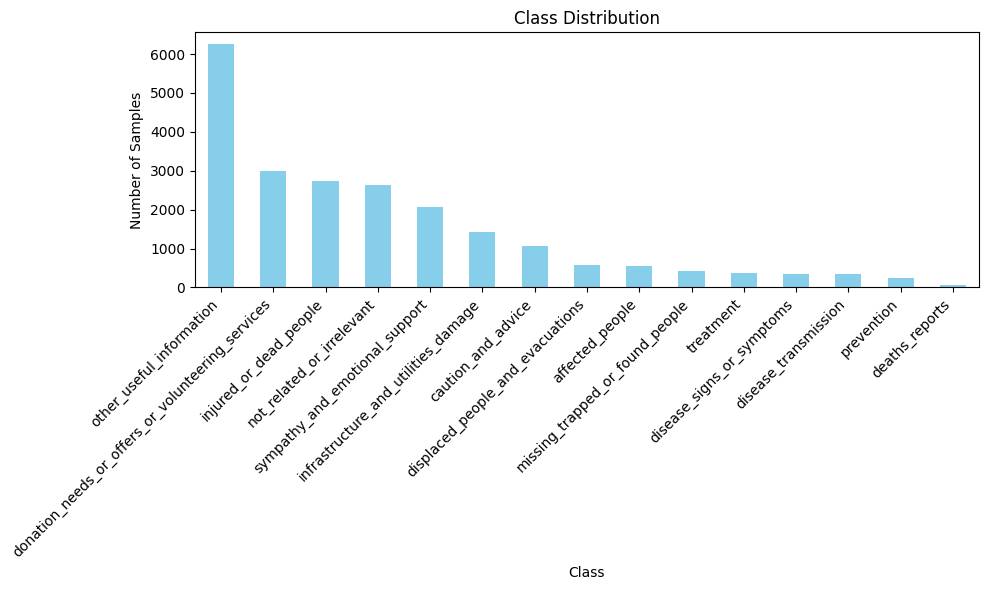

In [ ]:
df['label'].value_counts().plot(kind='bar', figsize=(10,6), color='skyblue', title='Class Distribution')
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


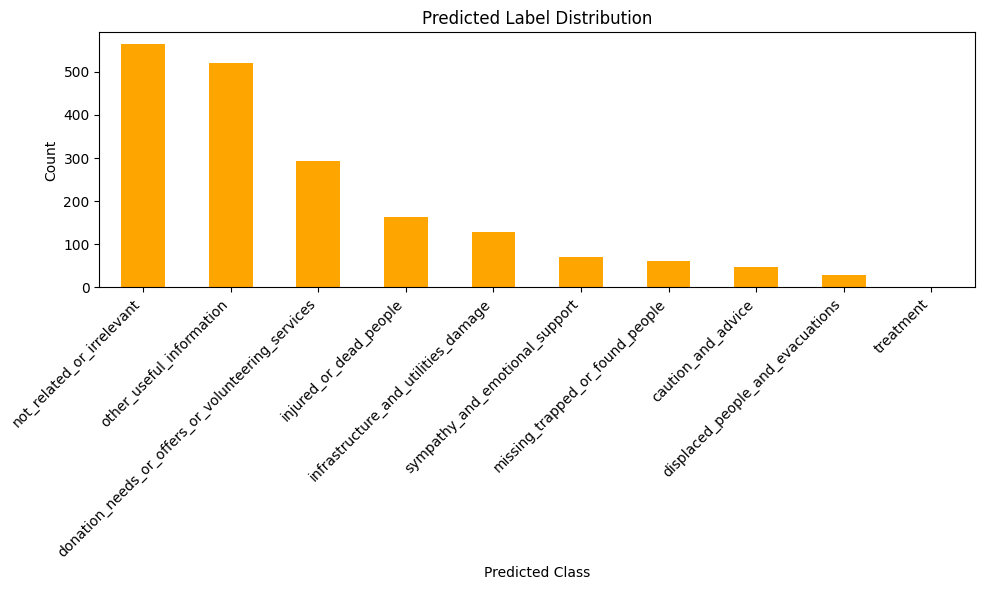

In [ ]:
df_RealData['predicted_category'].value_counts().plot(kind='bar', figsize=(10,6), color='orange', title='Predicted Label Distribution')
plt.xlabel("Predicted Class")
plt.ylabel("Count")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


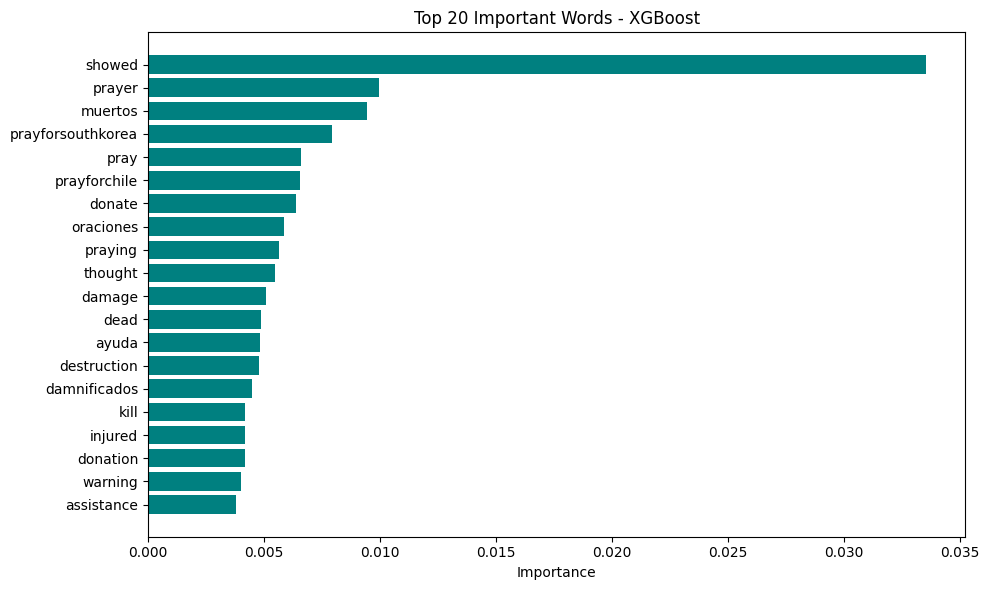

In [ ]:
import numpy as np

# For XGBoost
feature_names = bow.get_feature_names_out()
importances = xgb_model.feature_importances_
indices = np.argsort(importances)[-20:]  # Top 20 features

plt.figure(figsize=(10, 6))
plt.barh(range(len(indices)), importances[indices], color='teal')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.title("Top 20 Important Words - XGBoost")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()


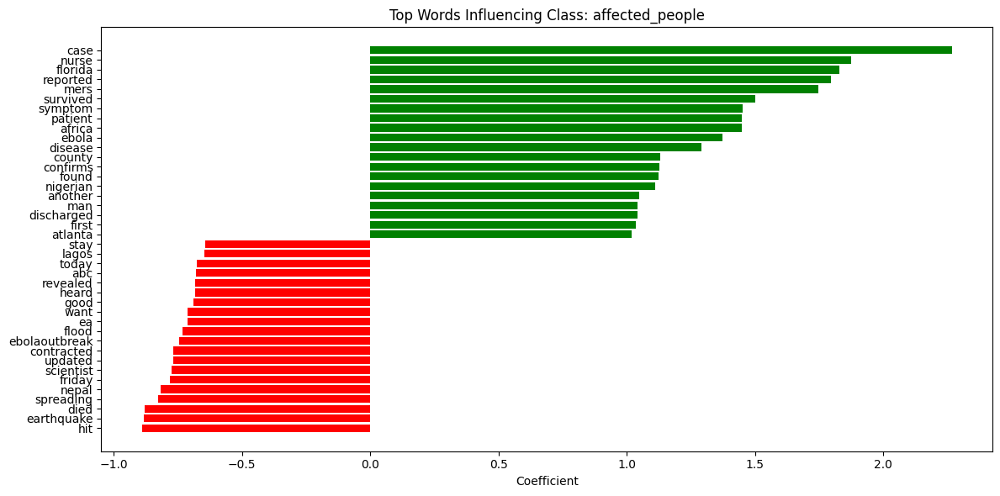

In [ ]:
# For Logistic Regression
feature_names = bow.get_feature_names_out()
coeffs = model_bow.coef_

# For multi-class, select a class index (e.g., 0 for the first class)
class_idx = 0
top_pos = np.argsort(coeffs[class_idx])[-20:]
top_neg = np.argsort(coeffs[class_idx])[:20]

# Plot
plt.figure(figsize=(12, 6))
plt.barh([feature_names[i] for i in top_neg], coeffs[class_idx][top_neg], color='red')
plt.barh([feature_names[i] for i in top_pos], coeffs[class_idx][top_pos], color='green')
plt.title(f"Top Words Influencing Class: {label_names[class_idx]}")
plt.xlabel("Coefficient")
plt.tight_layout()
plt.show()


In [ ]:
!pip install wordcloud matplotlib


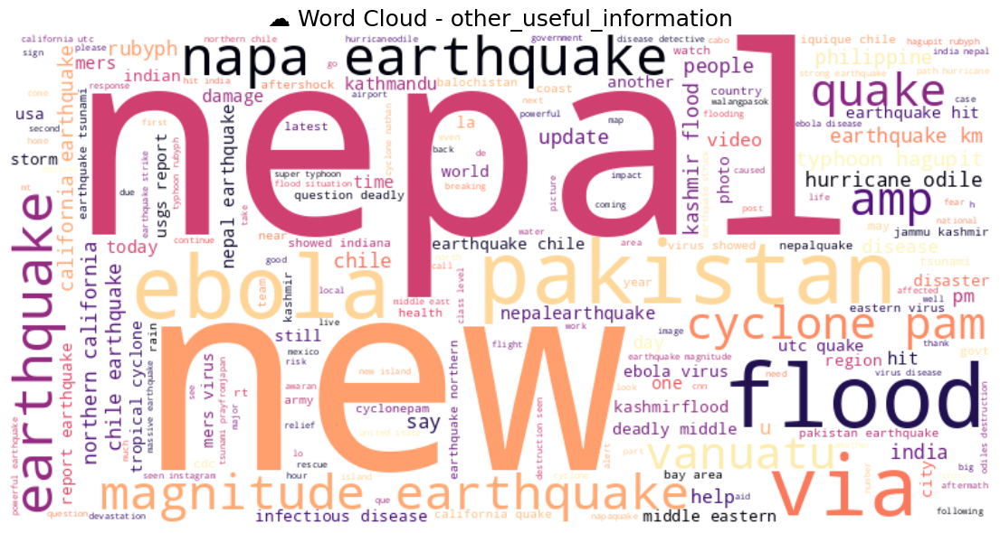

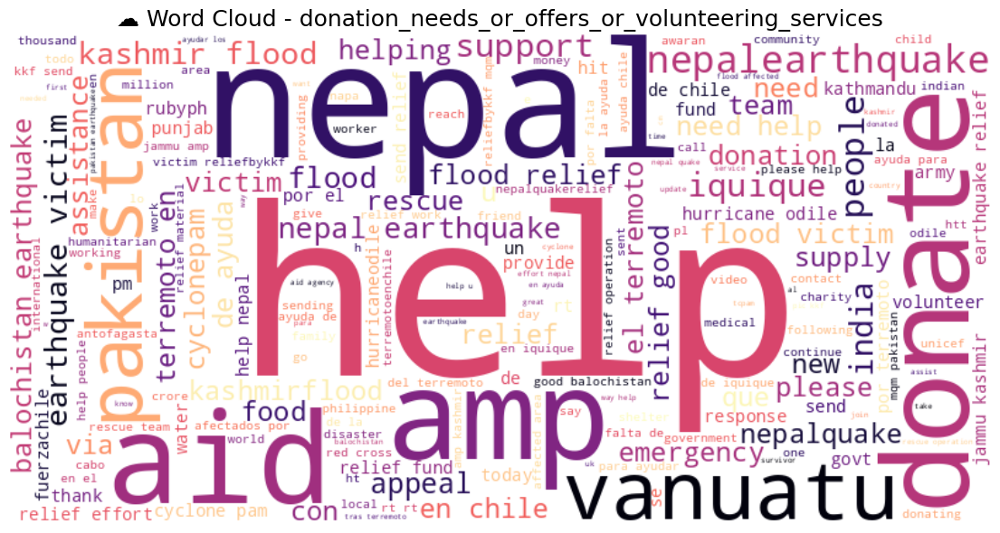

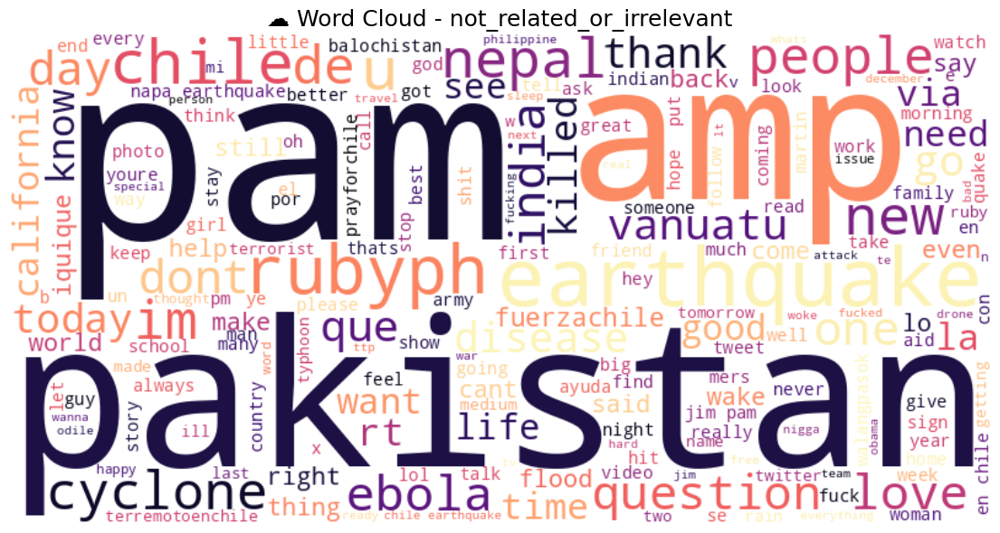

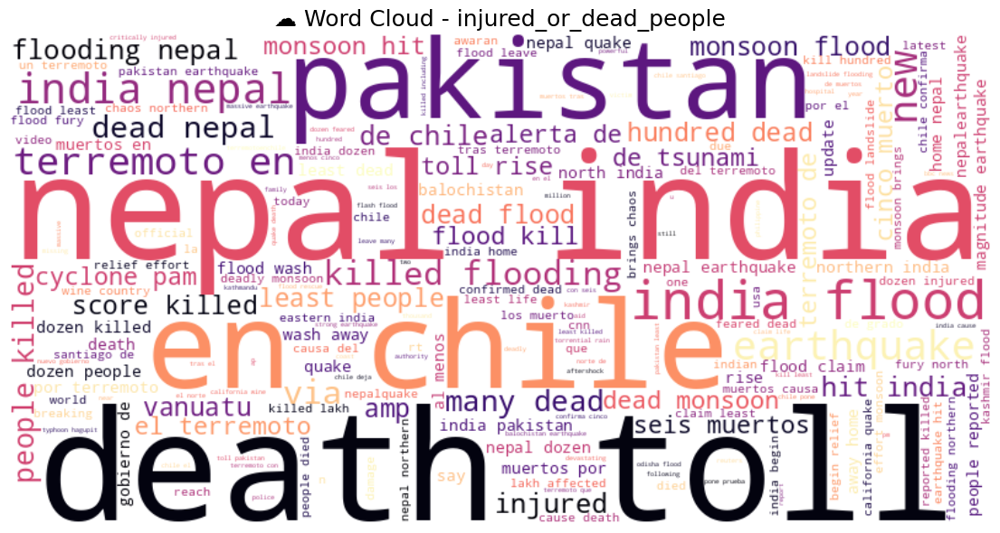

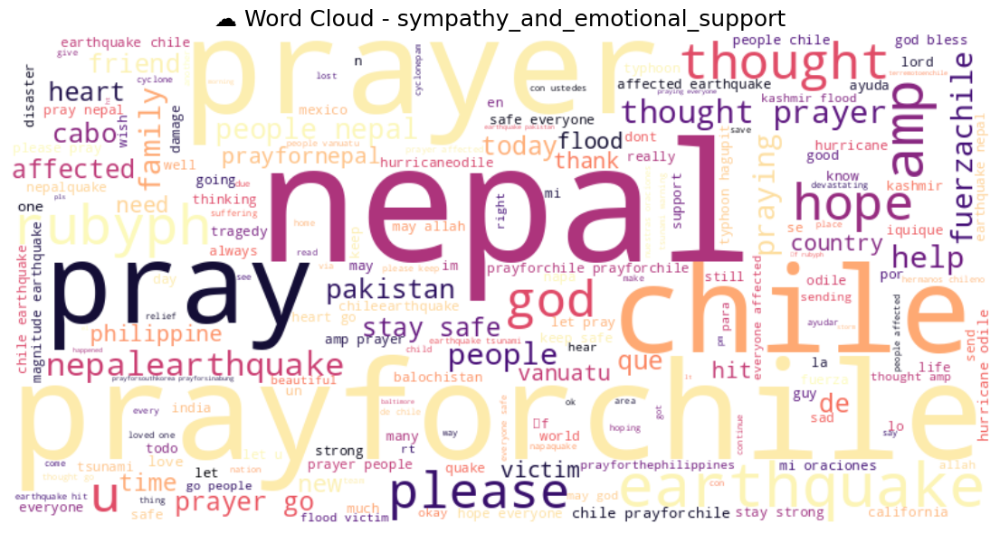

...

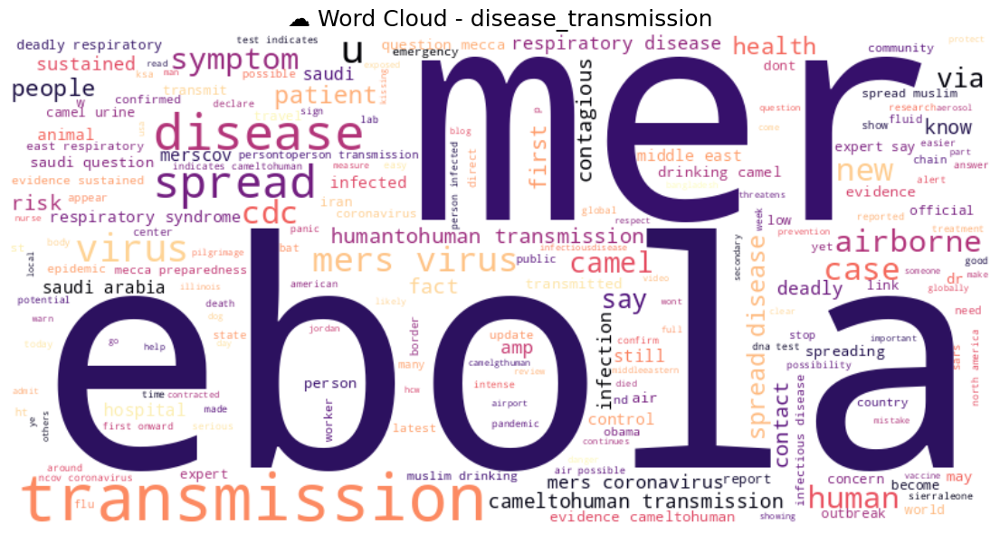

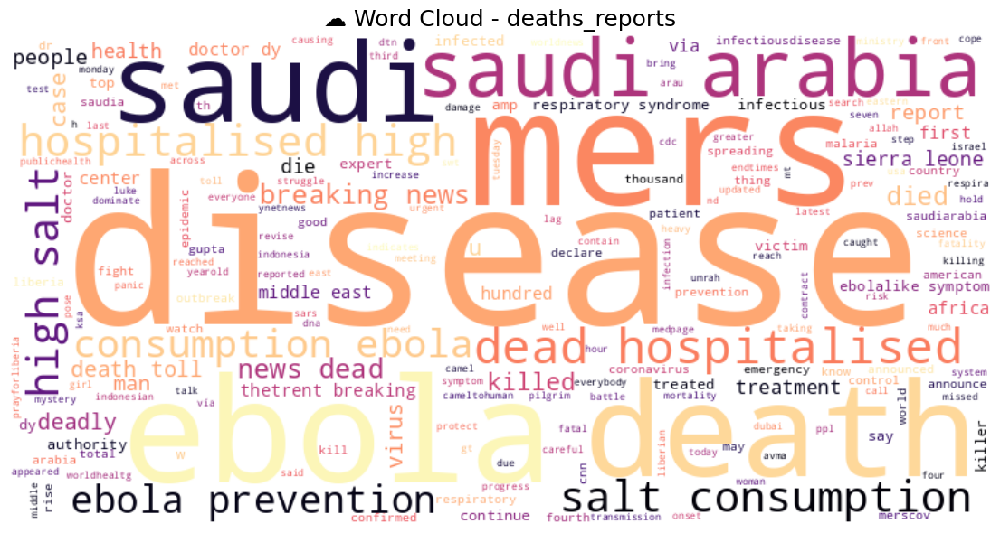

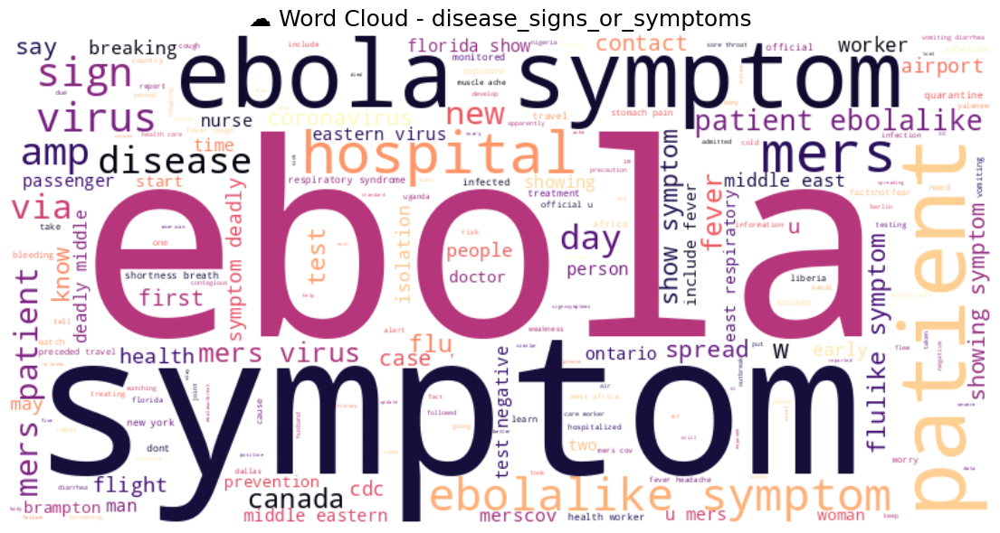

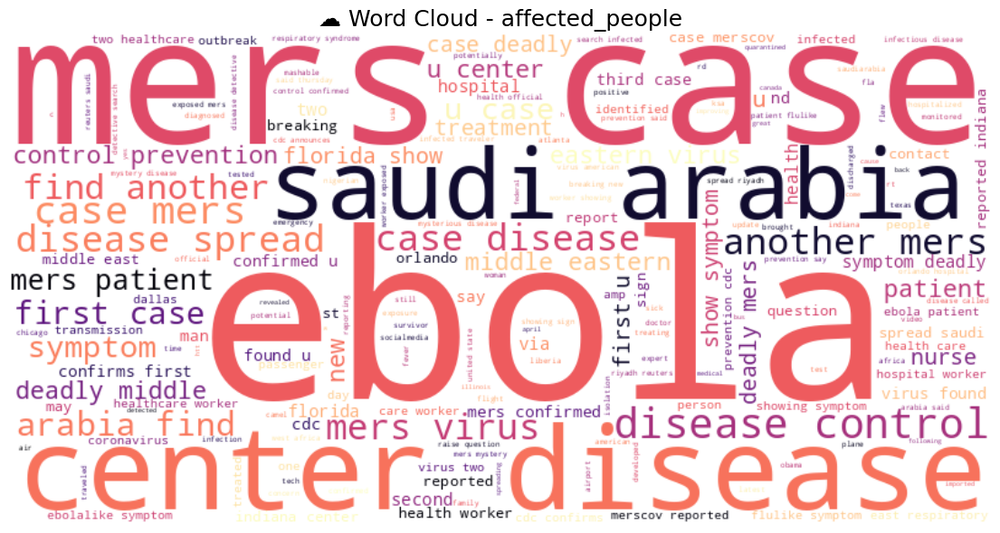

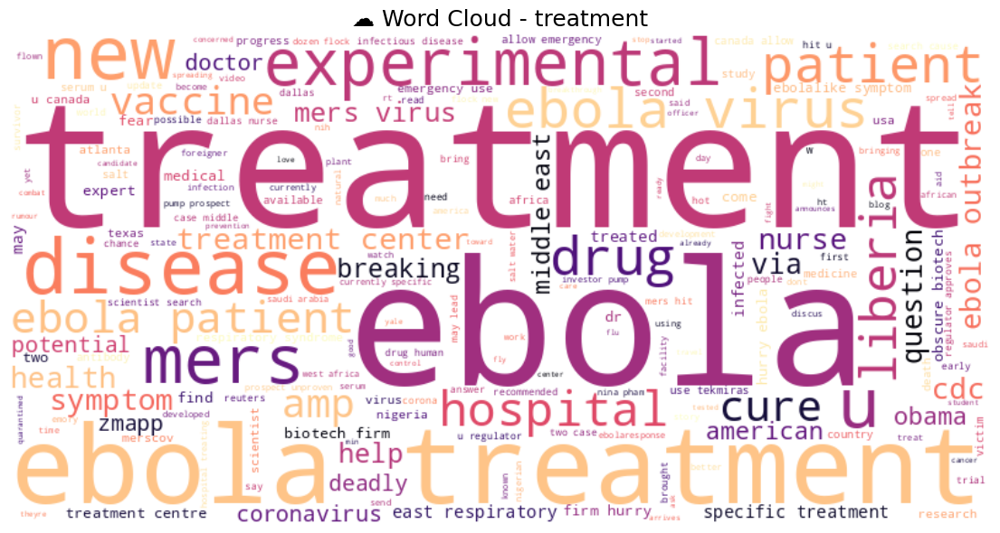

In [ ]:
# Create word clouds per category
unique_labels = df['label'].unique()

for label in unique_labels:
    class_text = " ".join(df[df['label'] == label]['clean_text'])
    if class_text.strip():  # make sure it's not empty
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='magma').generate(class_text)
        plt.figure(figsize=(12, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"☁️ Word Cloud - {label}", fontsize=18)
        plt.tight_layout()
        plt.show()


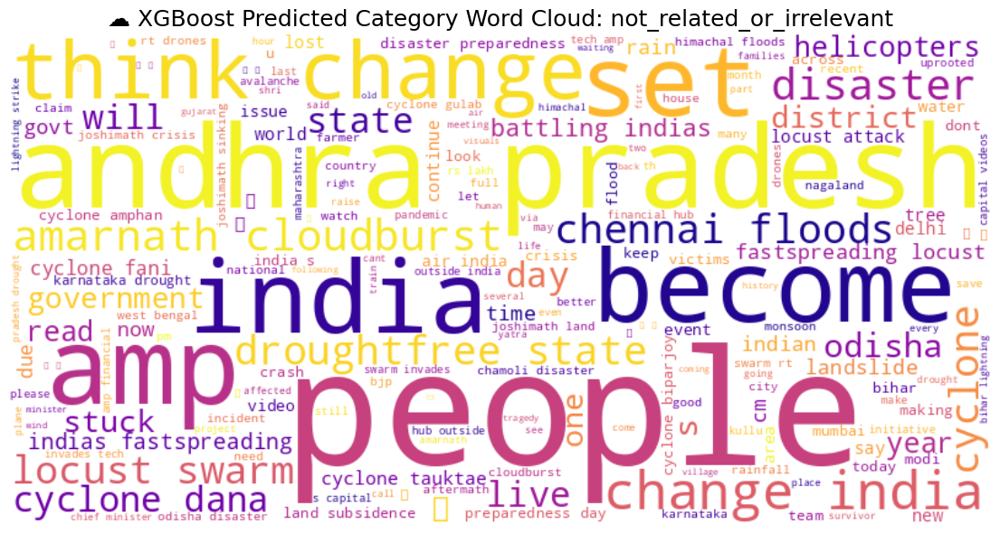

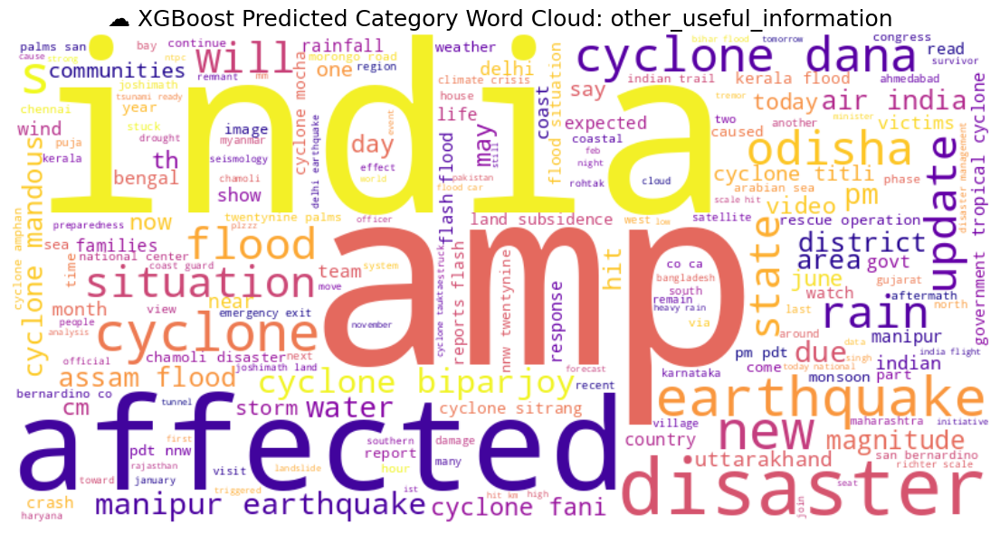

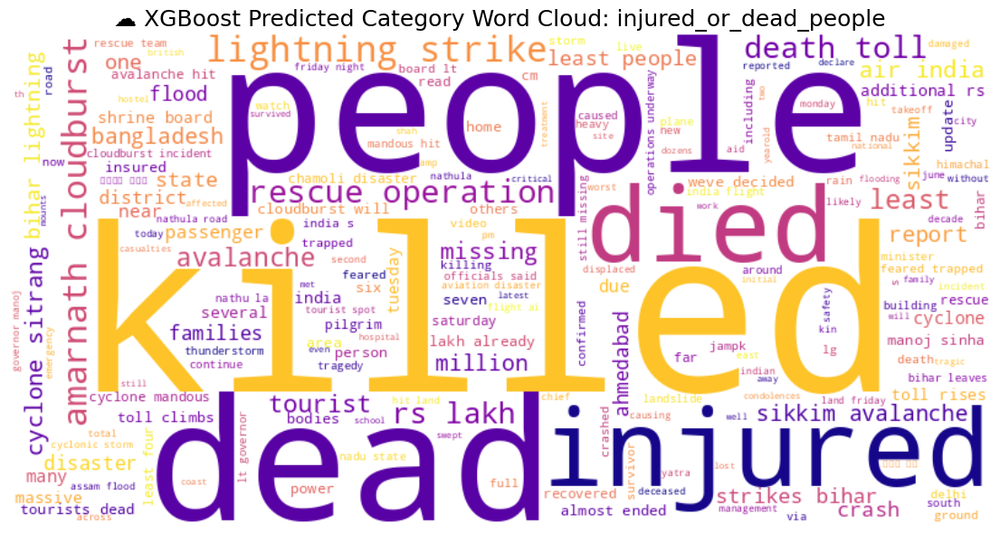

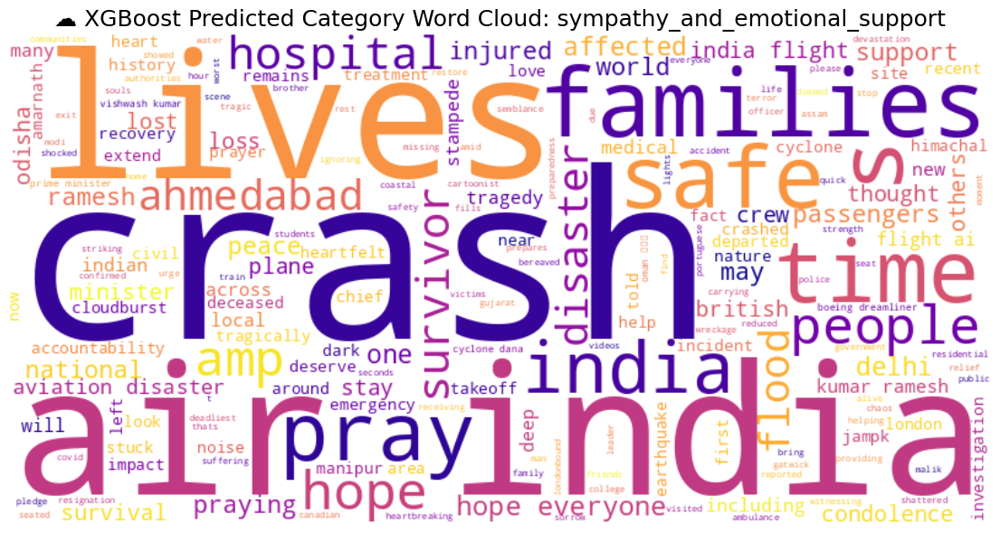

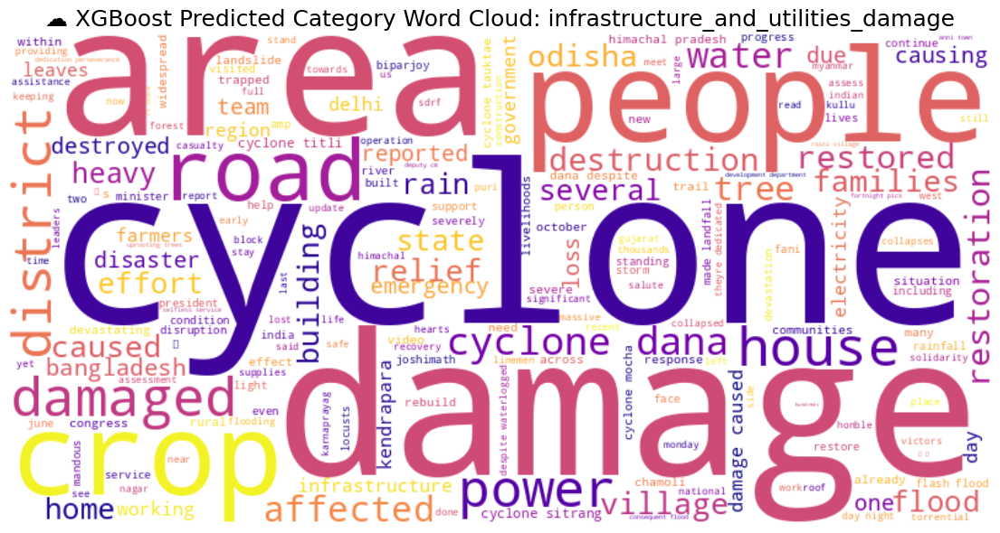

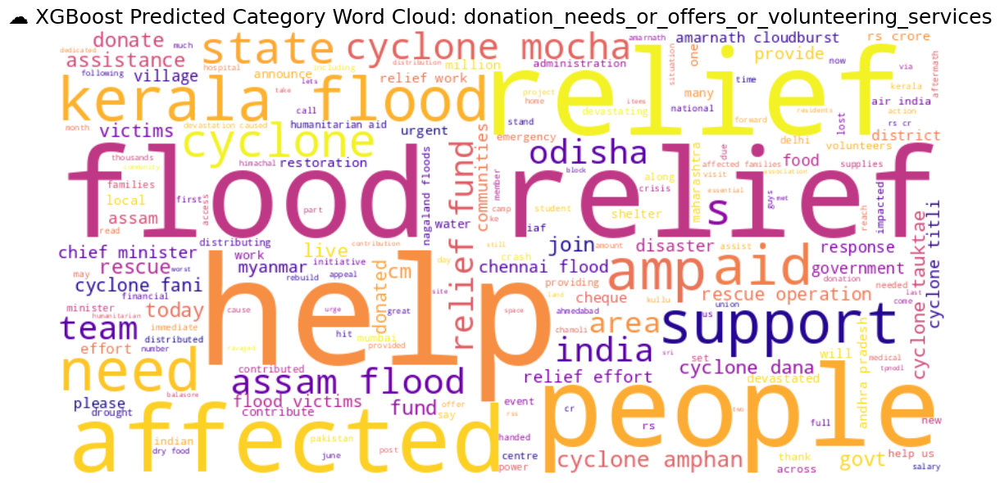

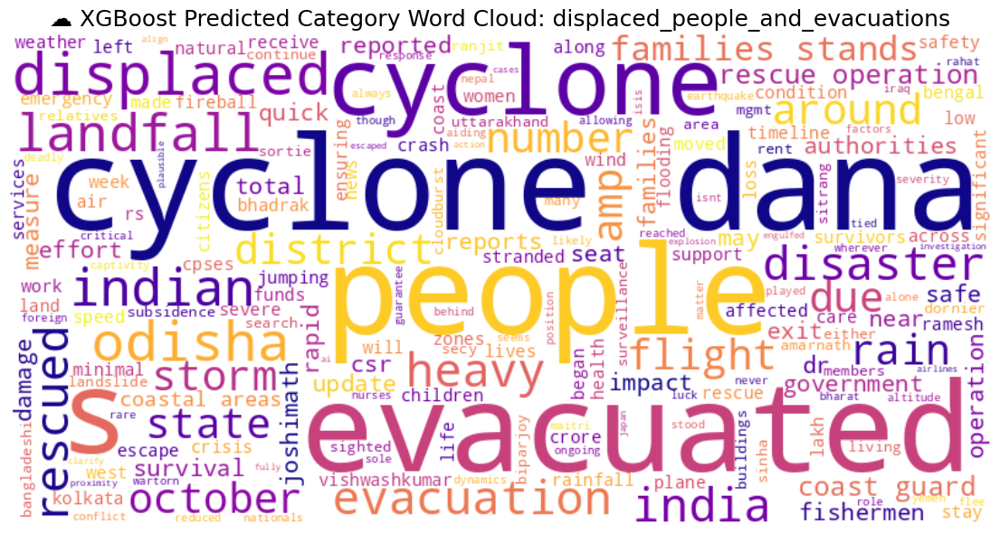

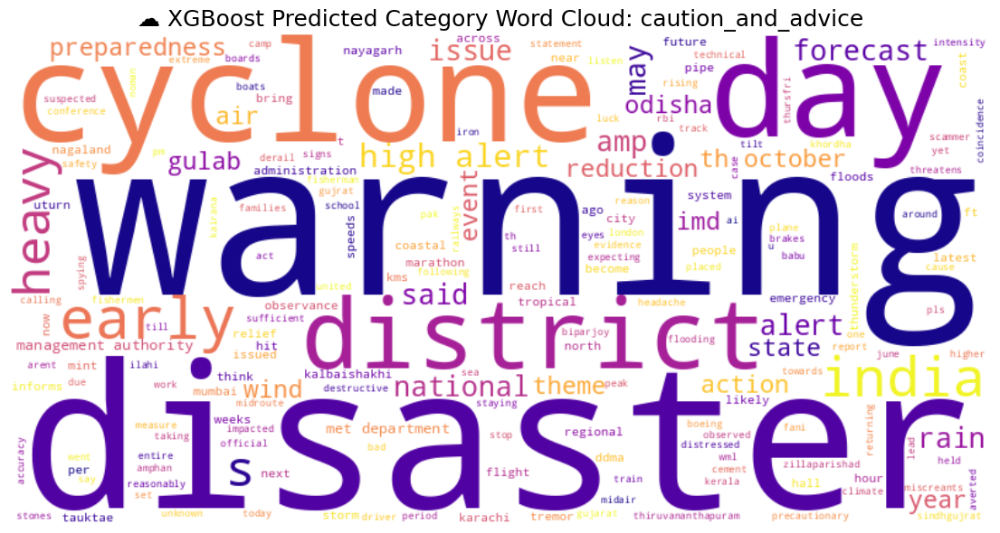

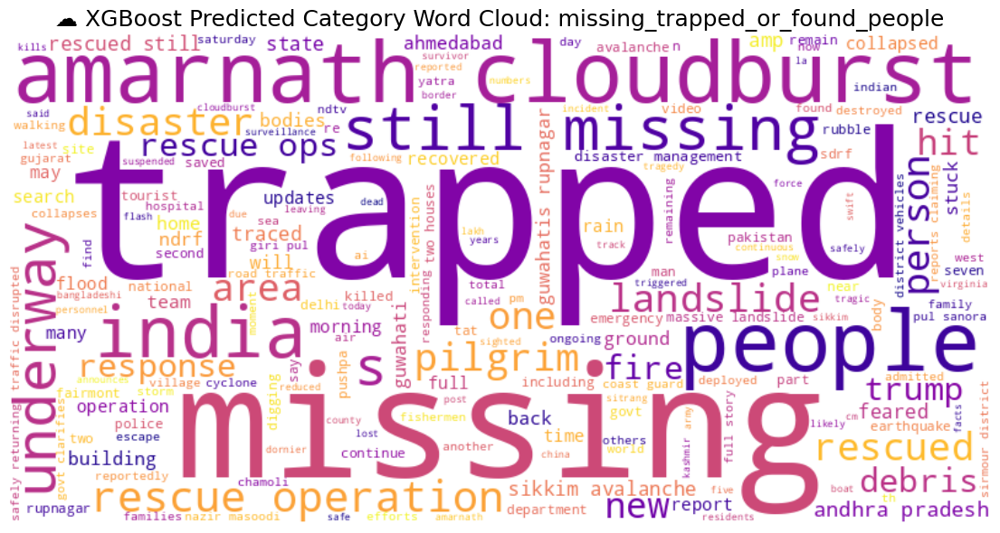

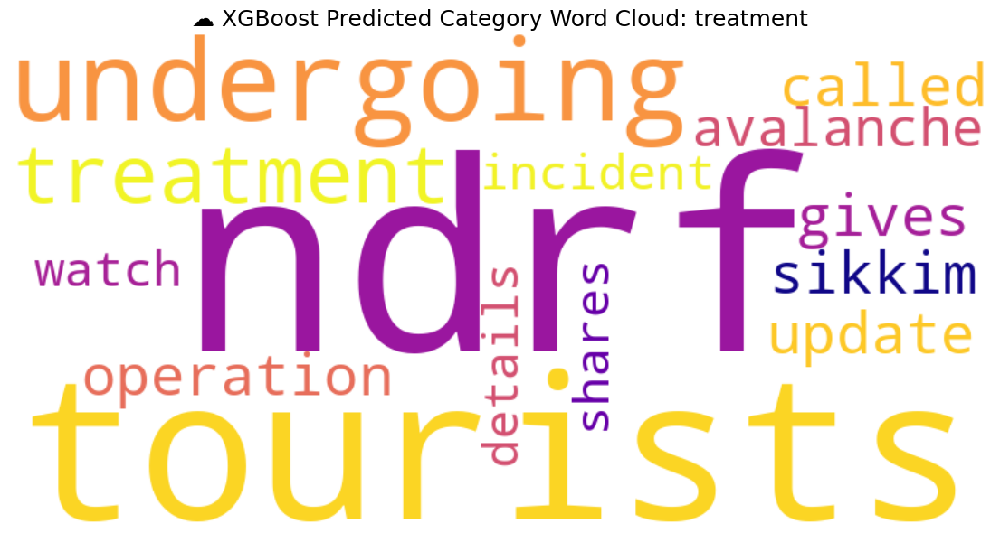

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 🔁 Group real data by predicted category and generate word clouds
predicted_labels = df_RealData['xgb_predicted_category'].unique()

for label in predicted_labels:
    class_text = " ".join(df_RealData[df_RealData['xgb_predicted_category'] == label]['cleaned_content'])
    if class_text.strip():  # avoid empty groups
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='plasma').generate(class_text)

        plt.figure(figsize=(12, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"☁️ XGBoost Predicted Category Word Cloud: {label}", fontsize=18)
        plt.tight_layout()
        plt.show()
